In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import tensorflow as tf
import numpy as np
import math
import matplotlib
#matplotlib.use("Agg")
import matplotlib.image as mpimg
import glob
from data_utils import load_data, augment_data,normalise_train,normalise_test,rgb2gray,rgb2lab,lab2rgb
import matplotlib.pyplot as plt
from tucha import complex_pokemon_model,baselinish,simpler_model,baselinish2,complex_pokemon_model2, baselinish3


In [4]:
from cs231n.data_utils import load_CIFAR10

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=10000):

    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)
    return X_train, y_train,  X_test, y_test


# Invoke the above function to get our data.
X_train, y_train, X_test, y_test = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (50000, 32, 32, 3)
Train labels shape:  (50000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


In [5]:
def show_images(images,gray = False):   
    if(gray):
        plt.imshow(images,cmap = plt.get_cmap('gray'))
    else :
        plt.imshow(images);
    plt.show()

epoch number: 1


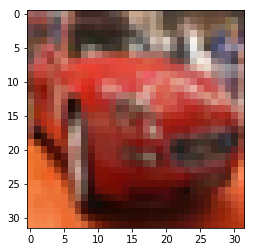

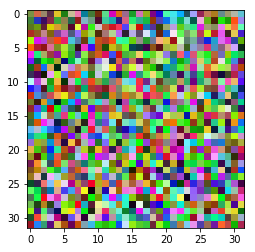

********************* results on validation set below


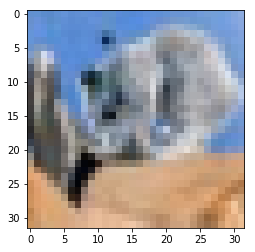

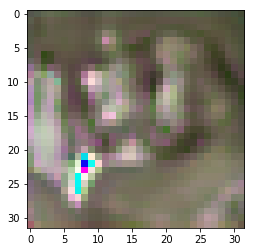

Next Epoch 2
*********************
epoch number: 2


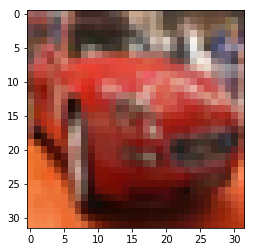

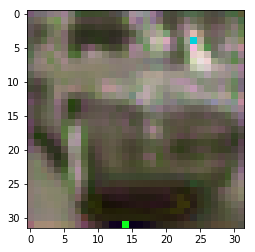

********************* results on validation set below


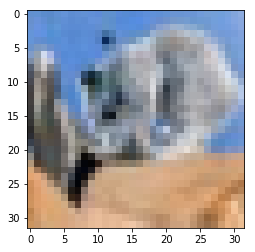

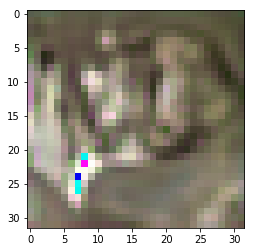

Next Epoch 3
*********************
epoch number: 3


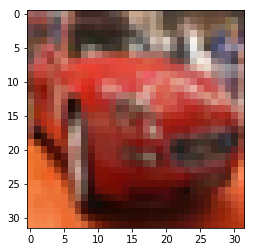

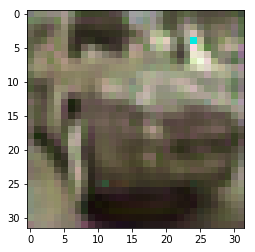

********************* results on validation set below


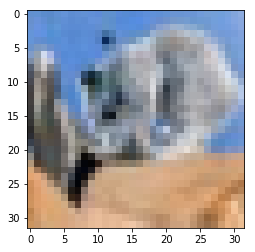

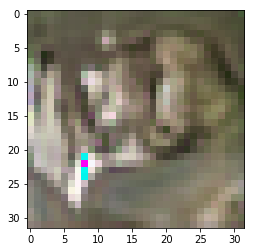

Next Epoch 4
*********************
epoch number: 4


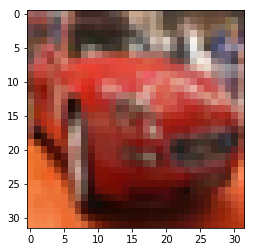

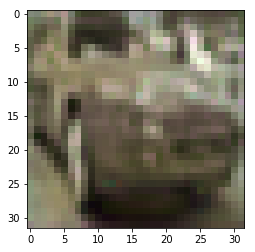

********************* results on validation set below


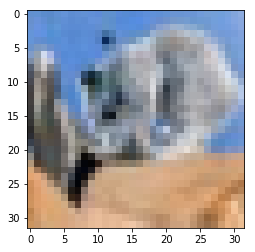

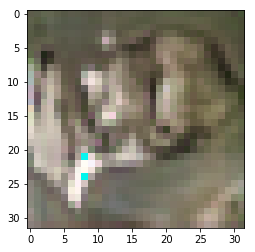

Next Epoch 5
*********************
epoch number: 5


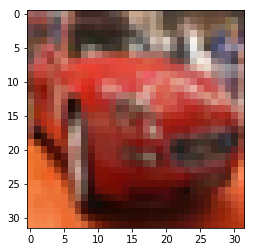

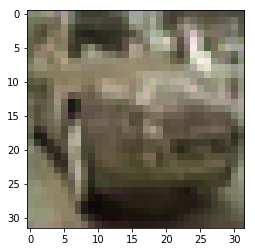

********************* results on validation set below


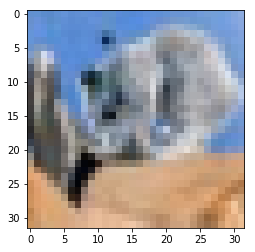

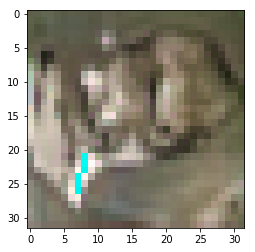

Next Epoch 6
*********************
epoch number: 6


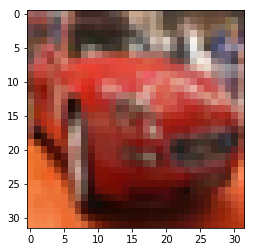

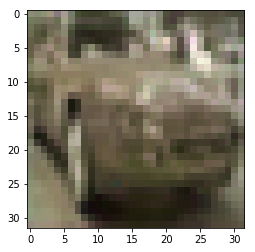

********************* results on validation set below


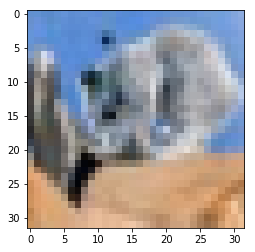

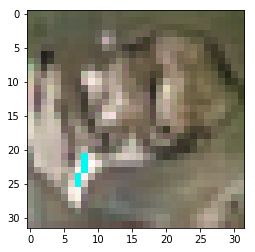

Next Epoch 7
*********************
epoch number: 7


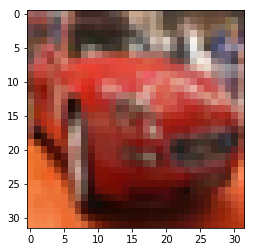

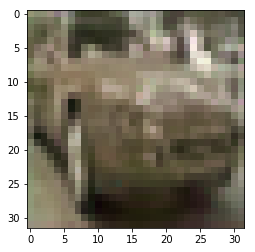

********************* results on validation set below


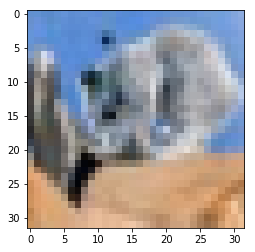

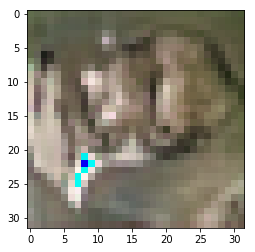

Next Epoch 8
*********************
epoch number: 8


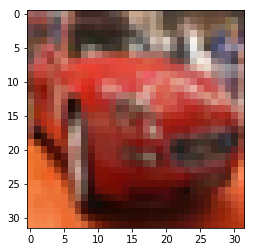

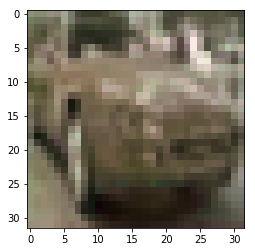

KeyboardInterrupt: 

In [47]:
tf.reset_default_graph()
Y = tf.placeholder(tf.uint8 ,[None , 32,32,3])
is_training = tf.placeholder(tf.bool)


#with tf.variable_scope("model") as scope:
hsv_out,rgb_out,hsv_in,rgb_in = complex_pokemon_model2(Y,is_training)
loss = tf.reduce_mean(tf.square(rgb_out-rgb_in))

optimiser = tf.train.AdamOptimizer(3e-3)
train_step = optimiser.minimize(loss)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

batch_size = 128
epoch_number = 0
def train_epoch(target):
    sizee = target.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y: (target[i*batch_size:batch_size*i+batch_size]),is_training:True}
        losses,_,rgb_o,rgb_i = sess.run([loss,train_step,rgb_out,rgb_in],feed_dict)
        if i%500 == 0:
            show_images(rgb_i[5])
            show_images(rgb_o[5])

  
def val_result(data, target):
    sizee = data.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y:  (target[i*batch_size:batch_size*i+batch_size]), is_training:True}
        rgb_o = sess.run([rgb_out],feed_dict)
        #print("validation loss:",losses)
        #if(i%5 ==0):
        show_images(rgb_o[5])
        show_images(rgb_i[5])

saver = tf.train.Saver()
num_epochs = 100
for i in range(num_epochs):
    print("epoch number:", i+1)
    epoch_number = i
    saver.save(sess,'cifar_model_pokemon_v2')
    train_epoch(X_train)
    print ("********************* results on validation set below")
    #val_result(X_val)
    abc = sess.run([rgb_out], feed_dict={Y:X_test[0:128], is_training:True})
    show_images(X_test[0])
    show_images(abc[0][0])
    print("epoch number:", i+1)
    show_images(X_test[1])
    show_images(abc[0][1])
    print("epoch number:", i+1)
    show_images(X_test[2])
    show_images(abc[0][2])
    print("epoch number:", i+1)
    show_images(X_test[3])
    show_images(abc[0][3])
    print("epoch number:", i+1)
    show_images(X_test[4])
    show_images(abc[0][4])
    print ("Next Epoch",i+2)
    print ("*********************")
    

training started for epoch: 1


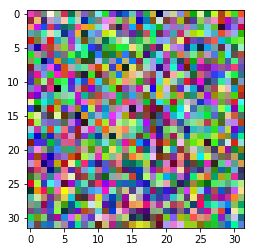

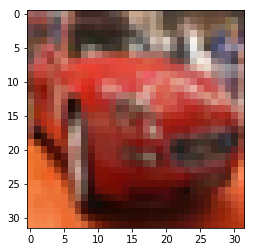

********************* results on validation set below


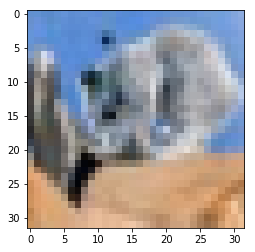

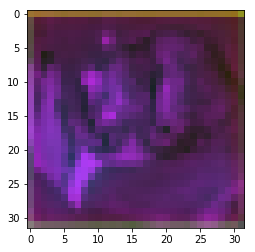

Next Epoch 2
*********************
training started for epoch: 2


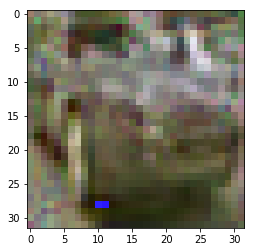

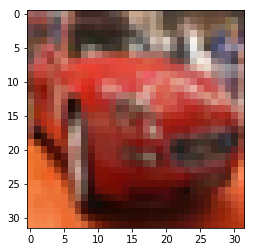

********************* results on validation set below


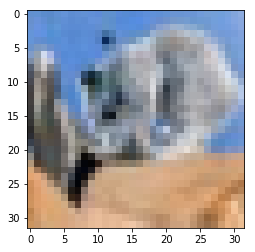

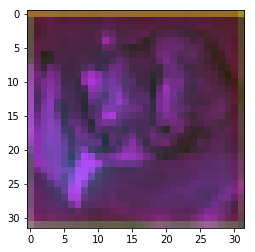

Next Epoch 3
*********************
training started for epoch: 3


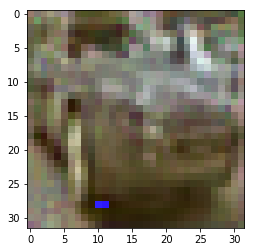

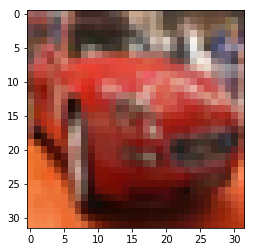

********************* results on validation set below


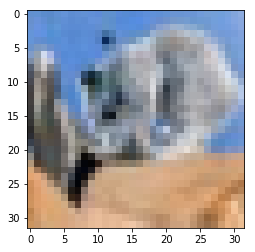

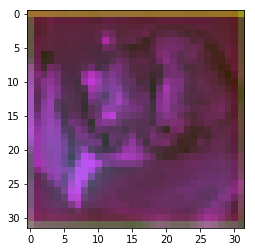

Next Epoch 4
*********************
training started for epoch: 4


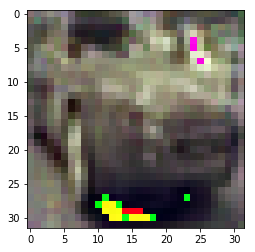

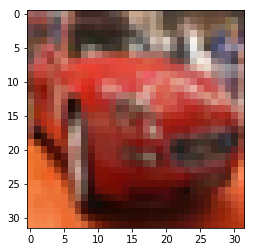

********************* results on validation set below


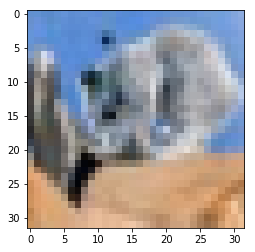

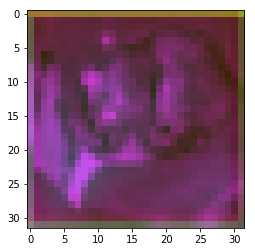

Next Epoch 5
*********************
training started for epoch: 5


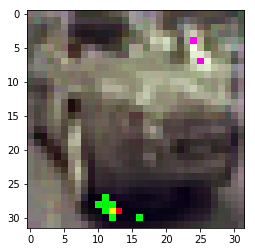

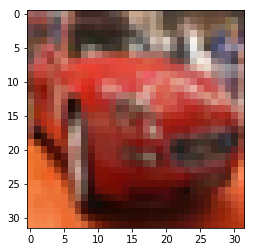

********************* results on validation set below


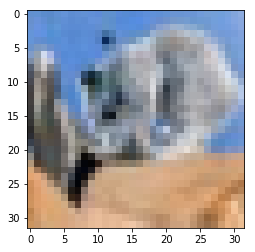

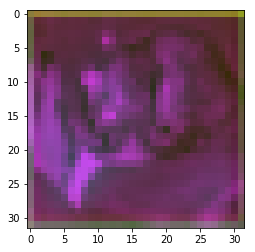

Next Epoch 6
*********************
training started for epoch: 6


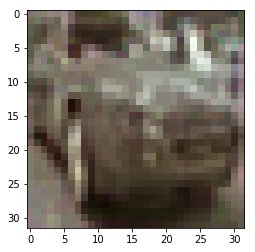

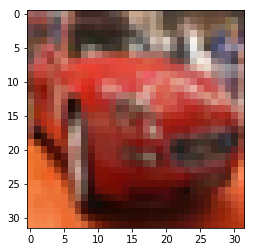

********************* results on validation set below


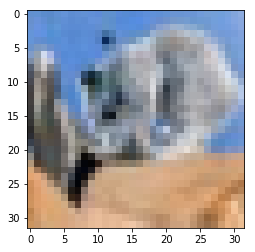

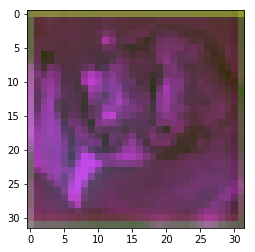

Next Epoch 7
*********************
training started for epoch: 7


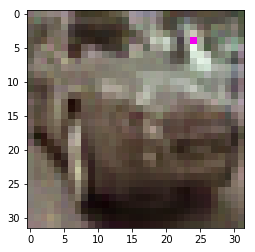

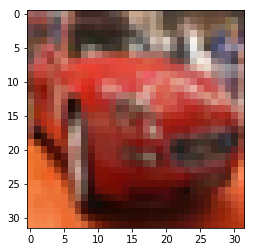

********************* results on validation set below


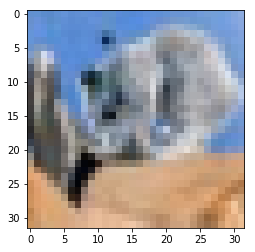

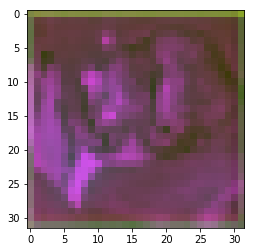

Next Epoch 8
*********************
training started for epoch: 8


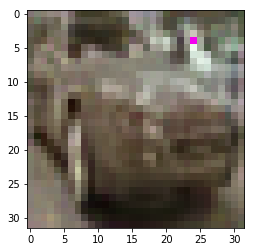

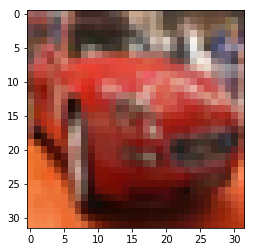

********************* results on validation set below


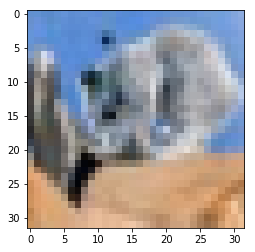

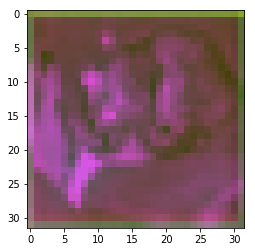

Next Epoch 9
*********************
training started for epoch: 9


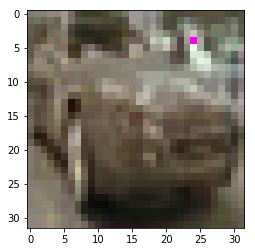

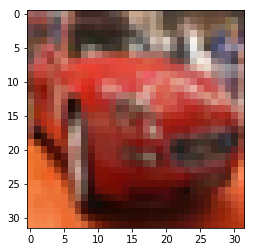

********************* results on validation set below


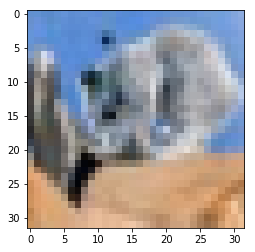

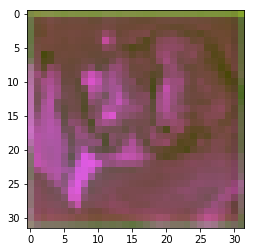

Next Epoch 10
*********************
training started for epoch: 10


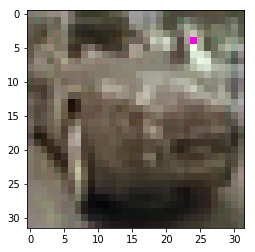

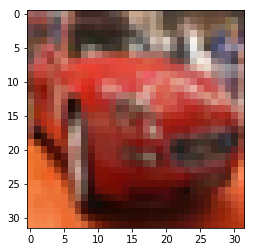

********************* results on validation set below


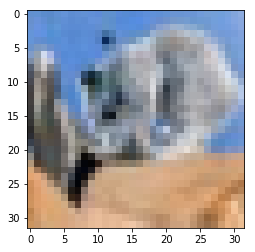

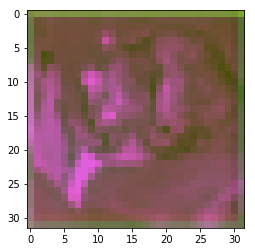

Next Epoch 11
*********************


In [34]:
tf.reset_default_graph()
Y = tf.placeholder(tf.uint8 ,[None , 32,32,3])
is_training = tf.placeholder(tf.bool)


#with tf.variable_scope("model") as scope:
hsv_out,rgb_out,hsv_in,rgb_in = baselinish3(Y,is_training)
loss = tf.reduce_mean(tf.square(rgb_out-rgb_in))

optimiser = tf.train.AdamOptimizer(3e-3)
train_step = optimiser.minimize(loss)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

batch_size = 128
epoch_number = 0
def train_epoch(target):
    sizee = target.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y: (target[i*batch_size:batch_size*i+batch_size]),is_training:True}
        losses,_,rgb_o,rgb_i = sess.run([loss,train_step,rgb_out,rgb_in],feed_dict)

        if i%500 == 0:
            show_images(rgb_o[5])
            show_images(rgb_i[5])
        #    print("training loss:", losses)

  
def val_result( target):
    sizee = target.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y:  (target[i*batch_size:batch_size*i+batch_size]), is_training:True}
        rgb_o = sess.run([rgb_out],feed_dict)
        #print("validation loss:",losses)
        #if(i%5 ==0):
        show_images(rgb_i[5])
        show_images(rgb_o[5])


def test_result( target):
    #sizee = target.shape[0]
    #for i in range(sizee//batch_size):
    feed_dict = {Y:  (target[0:batch_size]), is_training:True}
    rgb_o, rgb_i = sess.run([rgb_out, rgb_in],feed_dict)
    show_images(rgb_o[0][5])
    show_images(rgb_i[0][5])
saver = tf.train.Saver()
num_epochs = 10
for i in range(num_epochs):
    print("training started for epoch:", i+1)
    epoch_number = i
    saver.save(sess,'cifar_model')
    train_epoch(X_train)
    print ("********************* results on validation set below")
    #test_result(X_test)
    abc = sess.run([rgb_out], feed_dict={Y:X_test[0:128], is_training:False})
    #show_images(abc[0][0])
    #show_images(abc[0][10])
    show_images(X_test[0])
    show_images(abc[0][0])
    #show_images(abc[0][30])
    print ("Next Epoch",i+2)
    print ("*********************")
    

In [62]:


saver = tf.train.import_meta_graph('../models/cifar_p_epoch8_l2/cifar_model_pokemon.meta')
saver.restore(sess,tf.train.latest_checkpoint('./'))


INFO:tensorflow:Restoring parameters from ./cifar_model_pokemon_v3


INFO:tensorflow:Restoring parameters from ./cifar_model_pokemon_v3


In [63]:
abc = sess.run([rgb_out], feed_dict={Y:X_test[0:128], is_training:True})

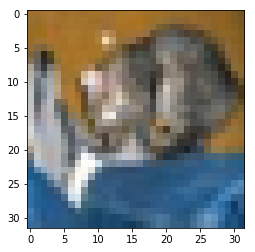

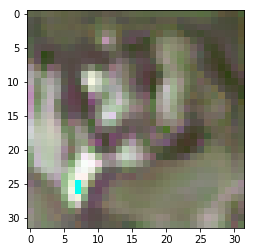

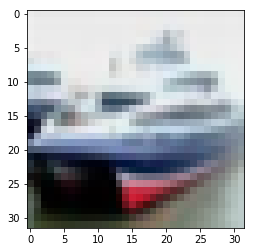

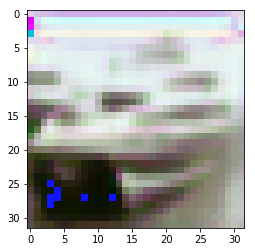

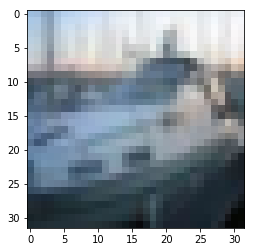

...

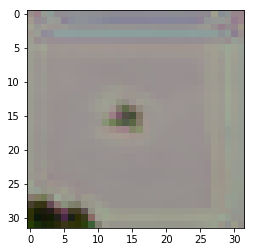

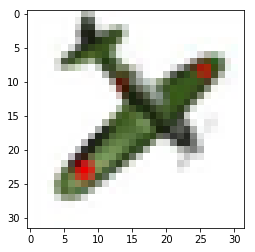

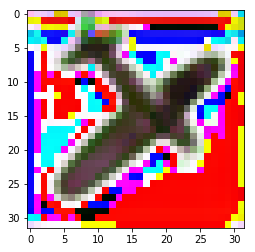

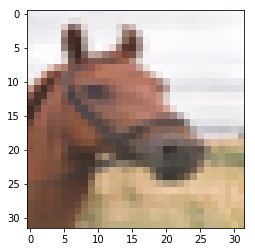

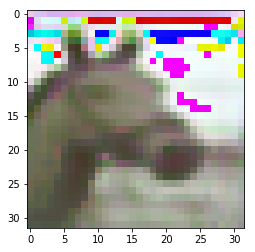

In [64]:
for i in range(100):
    show_images(X_test[i].astype('uint8'))
    show_images(abc[0][i])

epoch number: 1


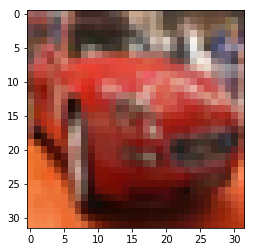

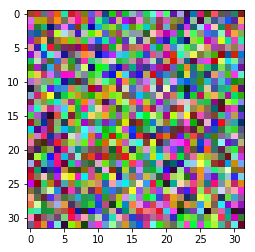

********************* results on validation set below


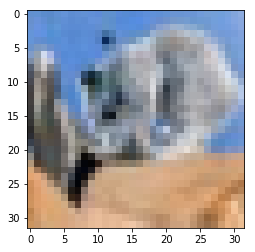

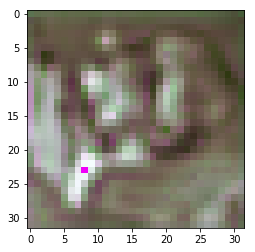

epoch number: 1


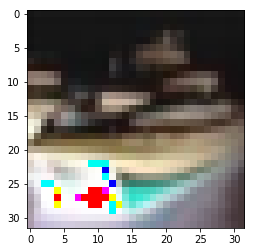

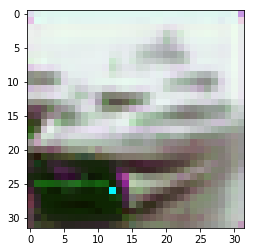

epoch number: 1


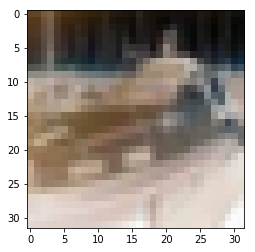

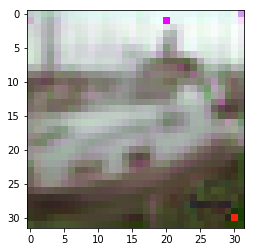

epoch number: 1


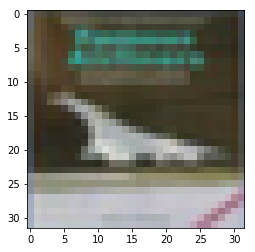

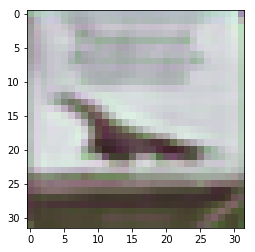

epoch number: 1


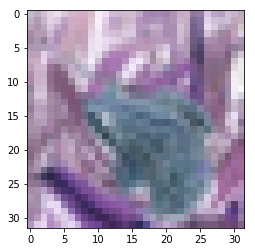

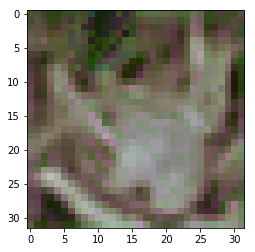

Next Epoch 2
*********************
epoch number: 2


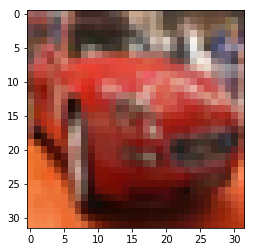

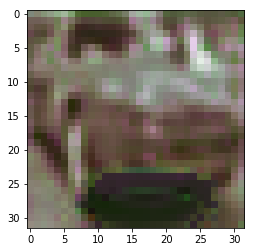

********************* results on validation set below


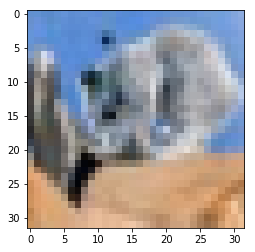

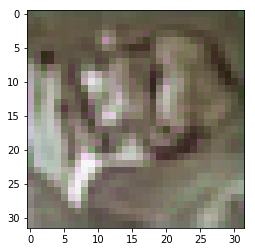

epoch number: 2


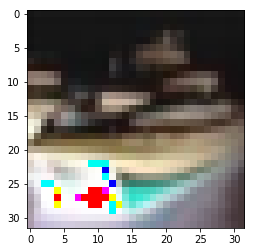

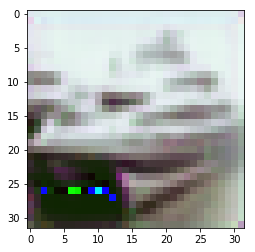

epoch number: 2


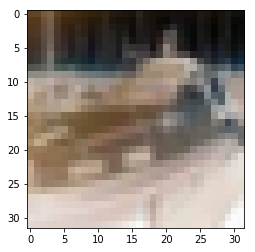

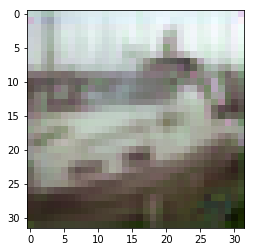

epoch number: 2


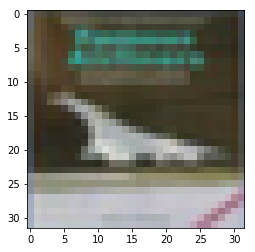

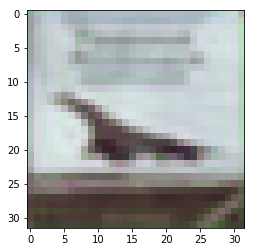

epoch number: 2


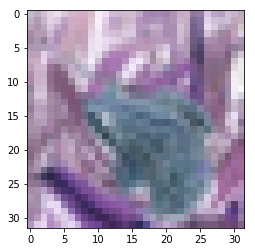

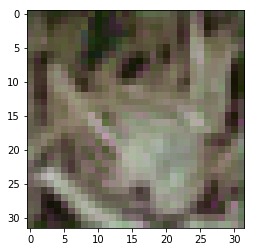

Next Epoch 3
*********************
epoch number: 3


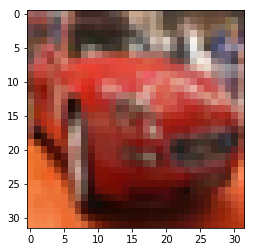

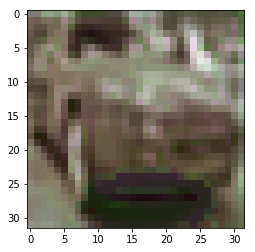

********************* results on validation set below


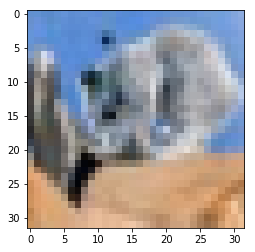

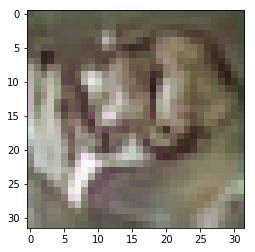

epoch number: 3


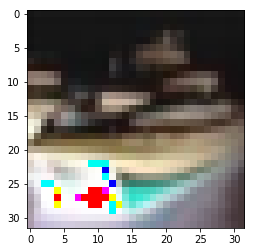

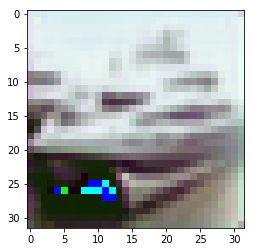

epoch number: 3


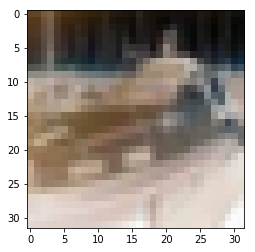

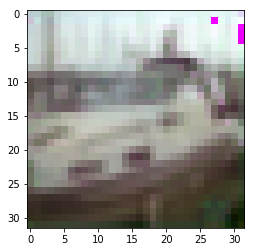

epoch number: 3


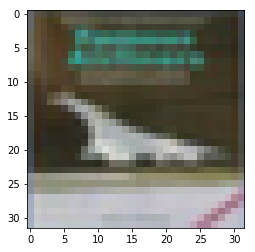

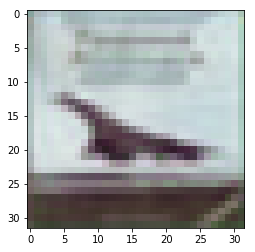

epoch number: 3


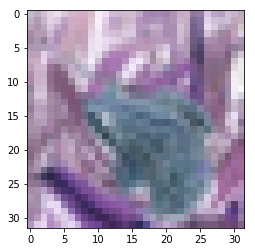

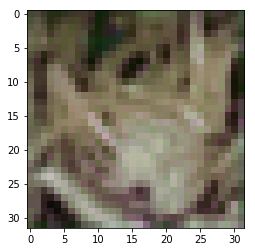

Next Epoch 4
*********************
epoch number: 4


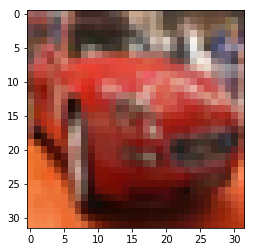

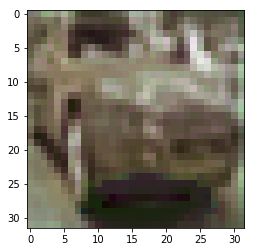

********************* results on validation set below


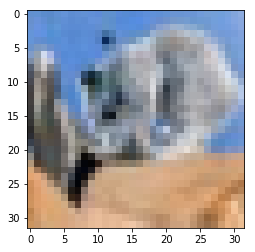

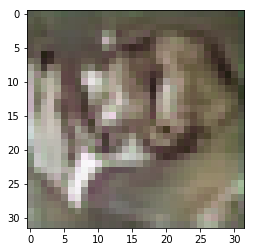

epoch number: 4


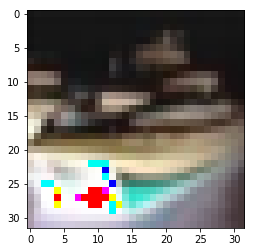

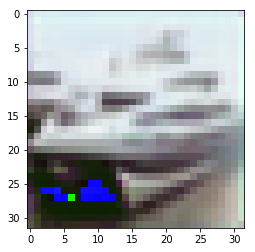

epoch number: 4


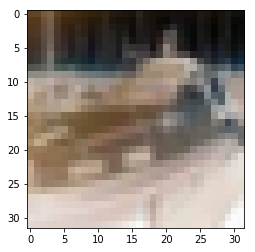

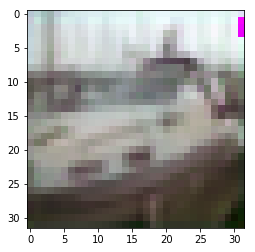

epoch number: 4


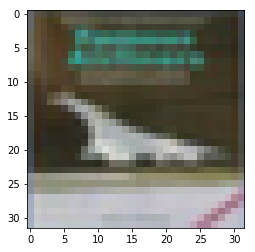

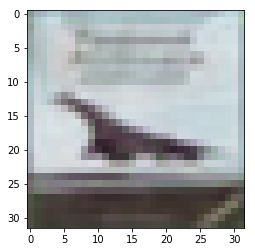

epoch number: 4


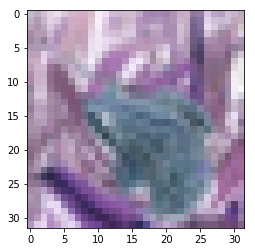

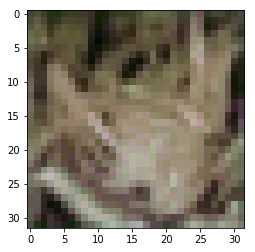

Next Epoch 5
*********************
epoch number: 5


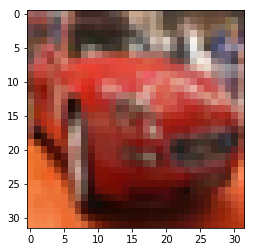

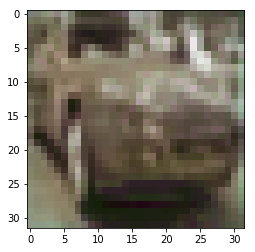

KeyboardInterrupt: 

In [56]:
tf.reset_default_graph()
Y = tf.placeholder(tf.uint8 ,[None , 32,32,3])
is_training = tf.placeholder(tf.bool)


#with tf.variable_scope("model") as scope:
hsv_out,rgb_out,hsv_in,rgb_in = complex_pokemon_model2(Y,is_training)
loss = tf.reduce_mean(tf.square(rgb_out-rgb_in))

optimiser = tf.train.AdamOptimizer(3e-3)
train_step = optimiser.minimize(loss)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

batch_size = 128
epoch_number = 0
def train_epoch(target):
    sizee = target.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y: (target[i*batch_size:batch_size*i+batch_size]),is_training:True}
        losses,_,rgb_o,rgb_i = sess.run([loss,train_step,rgb_out,rgb_in],feed_dict)
        if i%500 == 0:
            print("train loss", losses)
            show_images(rgb_i[5])
            show_images(rgb_o[5])

  
def val_result(data, target):
    sizee = data.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y:  (target[i*batch_size:batch_size*i+batch_size]), is_training:True}
        rgb_o = sess.run([rgb_out],feed_dict)
        #print("validation loss:",losses)
        #if(i%5 ==0):
        show_images(rgb_o[5])
        show_images(rgb_i[5])

saver = tf.train.Saver()
num_epochs = 100
for i in range(num_epochs):
    print("epoch number:", i+1)
    epoch_number = i
    saver.save(sess,'cifar_model_pokemon_v3')
    train_epoch(X_train)
    print ("********************* results on validation set below")
    #val_result(X_val)
    test_loss, abc = sess.run([loss, rgb_out], feed_dict={Y:X_test[0:128], is_training:True})
    print("test loss for epoch ", i, "is", test_loss)
    show_images(X_test[0])
    show_images(abc[0][0])
    print("epoch number:", i+1)
    show_images(X_test[1])
    show_images(abc[0][1])
    print("epoch number:", i+1)
    show_images(X_test[2])
    show_images(abc[0][2])
    print("epoch number:", i+1)
    show_images(X_test[3])
    show_images(abc[0][3])
    print("epoch number:", i+1)
    show_images(X_test[4])
    show_images(abc[0][4])
    print ("Next Epoch",i+2)
    print ("*********************")
    

epoch number: 1
train loss 1.41143


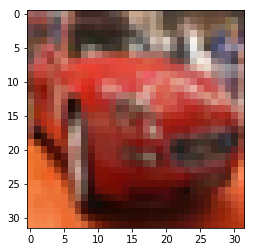

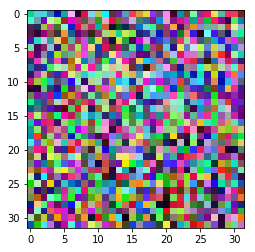

********************* results on validation set below
test loss for epoch  0 is 0.00864088


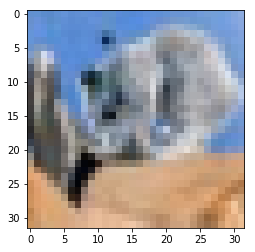

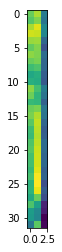

epoch number: 1


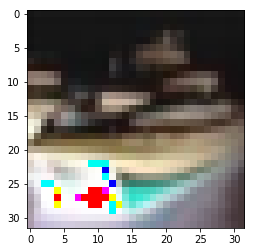

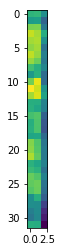

epoch number: 1


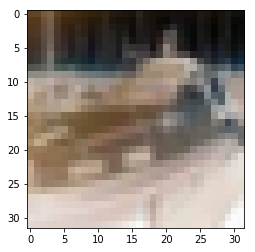

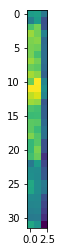

epoch number: 1


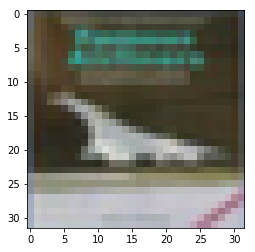

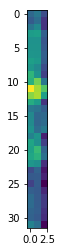

epoch number: 1


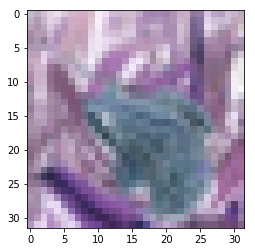

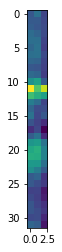

Next Epoch 2
*********************
epoch number: 2
train loss 0.00989886


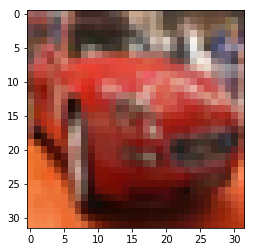

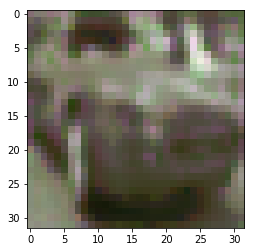

KeyboardInterrupt: 

In [61]:
tf.reset_default_graph()
Y = tf.placeholder(tf.uint8 ,[None , 32,32,3])
is_training = tf.placeholder(tf.bool)


#with tf.variable_scope("model") as scope:
hsv_out,rgb_out,hsv_in,rgb_in = complex_pokemon_model2(Y,is_training)
loss = tf.reduce_mean(tf.abs(rgb_out-rgb_in))

optimiser = tf.train.AdamOptimizer(3e-3)
train_step = optimiser.minimize(loss)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

batch_size = 128
epoch_number = 0
def train_epoch(target):
    sizee = target.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y: (target[i*batch_size:batch_size*i+batch_size]),is_training:True}
        losses,_,rgb_o,rgb_i = sess.run([loss,train_step,rgb_out,rgb_in],feed_dict)
        if i%500 == 0:
            print("train loss", losses)
            show_images(rgb_i[5])
            show_images(rgb_o[5])

  
def val_result(data, target):
    sizee = data.shape[0]
    for i in range(sizee//batch_size):
        feed_dict = {Y:  (target[i*batch_size:batch_size*i+batch_size]), is_training:True}
        rgb_o = sess.run([rgb_out],feed_dict)
        #print("validation loss:",losses)
        #if(i%5 ==0):
        show_images(rgb_o[5])
        show_images(rgb_i[5])

saver = tf.train.Saver()
num_epochs = 8
for i in range(num_epochs):
    print("epoch number:", i+1)
    epoch_number = i
    saver.save(sess,'cifar_model_pokemon_v3')
    train_epoch(X_train)
    print ("********************* results on validation set below")
    #val_result(X_val)
    abc = sess.run([loss, rgb_out], feed_dict={Y:X_test[0:128], is_training:True})
    print("test loss for epoch ", i, "is", test_loss)
    show_images(X_test[0])
    show_images(abc[0][0])
    print("epoch number:", i+1)
    show_images(X_test[1])
    show_images(abc[0][1])
    print("epoch number:", i+1)
    show_images(X_test[2])
    show_images(abc[0][2])
    print("epoch number:", i+1)
    show_images(X_test[3])
    show_images(abc[0][3])
    print("epoch number:", i+1)
    show_images(X_test[4])
    show_images(abc[0][4])
    print ("Next Epoch",i+2)
    print ("*********************")
    

In [90]:
from Loss_metrics import AUC
#saver = tf.train.import_meta_graph('../models/cifar_p_epoch8_l2/cifar_model_pokemon.meta')
tf.reset_default_graph()
Y = tf.placeholder(tf.uint8 ,[None , 32,32,3])
is_training = tf.placeholder(tf.bool)


#with tf.variable_scope("model") as scope:
hsv_out,rgb_out,hsv_in,rgb_in = complex_pokemon_model2(Y,is_training)
loss = tf.reduce_mean(tf.square(rgb_out-rgb_in))

optimiser = tf.train.AdamOptimizer(3e-3)
train_step = optimiser.minimize(loss)

sess = tf.Session()
saver = tf.train.Saver()
#sess.run(tf.global_variables_initializer())

#saver = tf.train.import_meta_graph('../models/cifar_p_epoch8_l2/cifar_model_pokemon.meta')
#saver.restore(sess,tf.train.latest_checkpoint('./'))
saver.restore(sess,'../models/cifar_p_epoch8_l2/cifar_model_pokemon')



INFO:tensorflow:Restoring parameters from ../models/cifar_p_epoch8_l2/cifar_model_pokemon


INFO:tensorflow:Restoring parameters from ../models/cifar_p_epoch8_l2/cifar_model_pokemon


In [84]:
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
def show_images(images):
    images = np.reshape(images, [images.shape[0], -1,3])
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg,3]))
    return

In [85]:
def show_images2(images):
    images = np.reshape(images, [images.shape[0], -1])
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]),cmap = plt.get_cmap('gray'))
    return

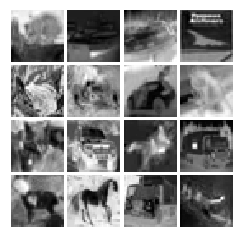

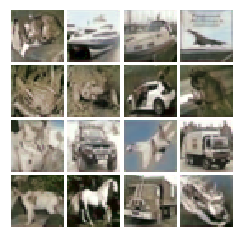

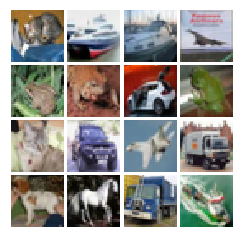

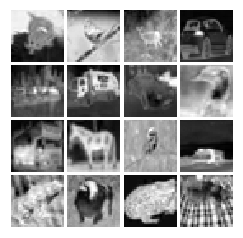

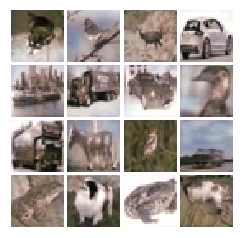

...

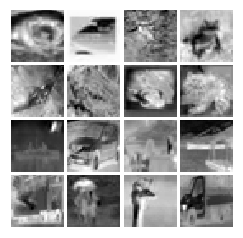

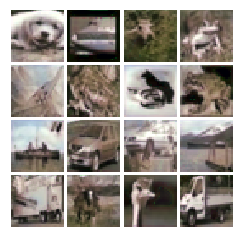

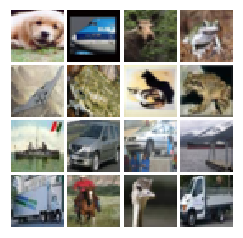

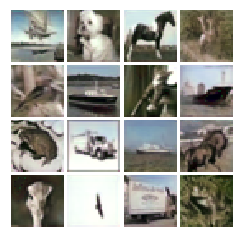

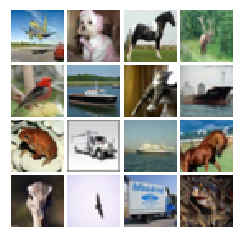

30670848
3072
0.983778952406


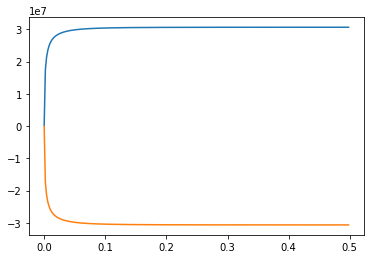

In [92]:
X_test_sampled = X_test[:128*78,:,:,:]

X_test_model_gen = np.zeros([128*78,X_test.shape[1],X_test.shape[2],X_test.shape[3]])
X_orig_model = np.zeros([128*78,X_test.shape[1],X_test.shape[2],X_test.shape[3]])

for i in range(78):
    minibatch = X_test_sampled[i*128:(i+1)*128,:,:,:]
 
    samples,input_samples,gray = sess.run([rgb_out,rgb_in,hsv_in],feed_dict = {Y:minibatch,is_training:True})
    fig = show_images2(gray[:16,:,:,:1])
    plt.show()
    samples[samples>1] = 1
    samples [samples<0] = 0
    fig = show_images(samples[:16])
    plt.show()
    fig = show_images(input_samples[:16])
    plt.show()
    
    X_test_model_gen[i*128:(i+1)*128,:,:,:] = samples[:,:,:,:]
    X_orig_model[i*128:(i+1)*128,:,:,:] = input_samples[:,:,:,:]
 


rgb_i = X_orig_model
rgb_o = X_test_model_gen
rand_indices = np.random.choice(np.arange(128*78),batch_size)
minibatch = rgb_o[rand_indices]
fig = show_images(minibatch[:16])
plt.show()
minibatch = rgb_i[rand_indices]
fig = show_images(minibatch[:16])
plt.show()
print(rgb_i.size)
print(rgb_o[0].size)
auc, ans = AUC(np.reshape(rgb_i, [128*78, 32, 32, 3]), np.reshape(rgb_o, [128*78, 32, 32, 3]))
print(ans)

plt.plot(np.arange(0., 0.5, 0.5/256), auc)
plt.plot(np.arange(0., 0.5, 0.5/256), 1-auc)